<a href="https://colab.research.google.com/github/YashikaGrewal/ML-Project/blob/main/ML_Project_KMeans_Clustering_Applications.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Topic: Application of K-Means Clustering by identifying most Dominant Colours in an image

## 1. Image Compression

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

In [3]:
img1 = plt.imread('/content/IMG.jpg')

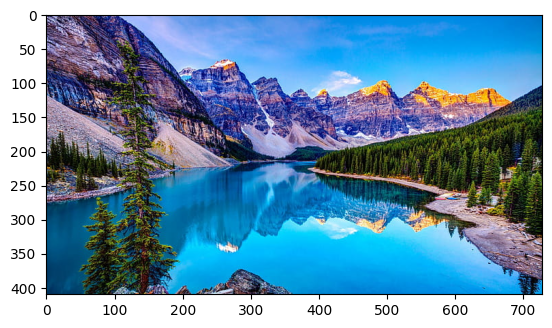

In [4]:
plt.imshow(img1)

In [5]:
print('Shape of original image',img1.shape)

Shape of original image (410, 728, 3)


In [6]:
pixels = np.reshape(img1, (img1.shape[0]*img1.shape[1],3))

In [7]:
print('Shape of modified image',pixels.shape)

Shape of modified image (298480, 3)


In [8]:
k = int(input("Number of Clusters: "))

Number of Clusters: 15


In [9]:
kmeans1 = KMeans(n_clusters=k,n_init = 10, random_state=42)
kmeans1.fit(pixels)

KMeans(n_clusters=15, n_init=10, random_state=42)

In [10]:
cluster_centers = kmeans1.cluster_centers_

In [11]:
cluster_centers

array([[ 81.25839459, 171.38314063, 242.04384766],
       [ 15.4475502 ,  18.26448588,  12.39322143],
       [ 79.58363678,  74.92779927, 125.98088302],
       [  6.45939625, 147.4237822 , 225.43326265],
       [173.66386467, 154.09703196, 183.19805936],
       [107.44845613, 104.98505146,  57.19326907],
       [137.75138735, 195.00483907, 248.94570477],
       [  8.06695899, 112.79050812, 175.29001806],
       [ 10.23403795, 182.10684655, 248.90116153],
       [ 20.18456294,  32.78871439,  76.37448259],
       [ 58.20678141,  61.65509782,  30.54580512],
       [214.89033756, 203.90471513, 220.07697803],
       [224.96267237, 168.17308607,  70.28126486],
       [126.49018109, 114.58058197, 154.95097711],
       [ 10.95422139,  70.01350844, 123.95523988]])

In [12]:
labels = kmeans1.labels_

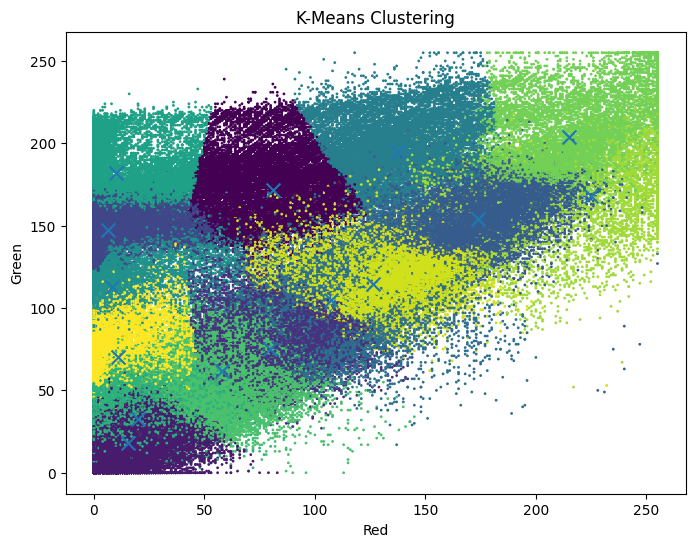

In [13]:
plt.figure(figsize=(8, 6))
plt.scatter(pixels[:, 0], pixels[:, 1], c=labels, s=1)
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='x', s=100)  # Plot cluster centers
plt.title('K-Means Clustering')
plt.xlabel('Red')
plt.ylabel('Green')
plt.show()

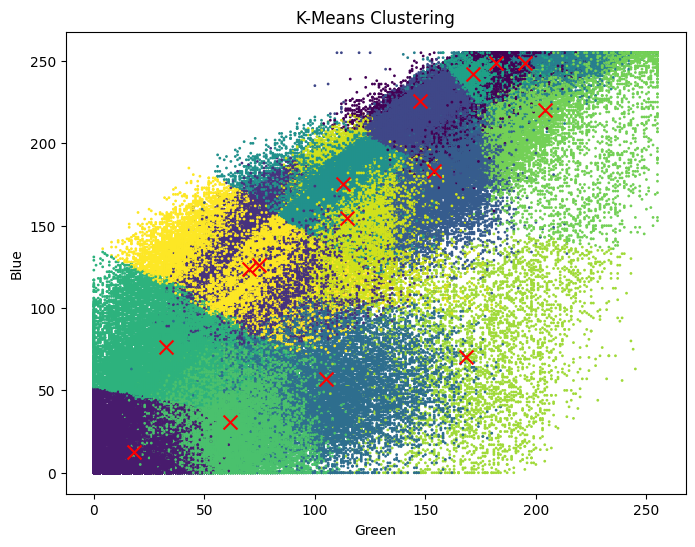

In [14]:
plt.figure(figsize=(8, 6))
plt.scatter(pixels[:, 1], pixels[:, 2], c=labels, s=1)
plt.scatter(cluster_centers[:, 1], cluster_centers[:, 2], c='red', marker='x', s=100)  # Plot cluster centers
plt.title('K-Means Clustering')
plt.xlabel('Green')
plt.ylabel('Blue')
plt.show()

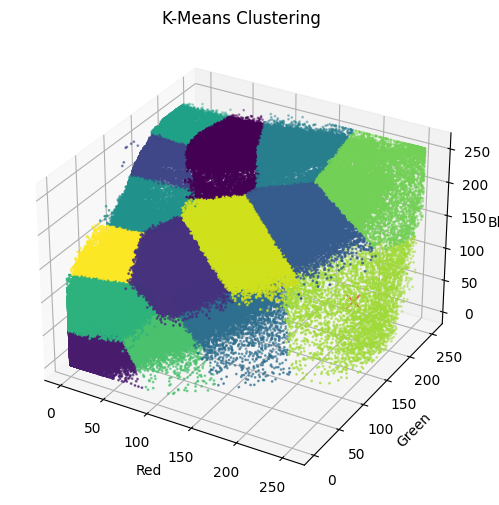

In [15]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pixels[:, 0], pixels[:, 1], pixels[:, 2], c=labels, s=1)
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2], c='red', marker='x', s=100)
ax.set_title('K-Means Clustering')
ax.set_xlabel('Red')
ax.set_ylabel('Green')
ax.set_zlabel('Blue')
plt.show()


In [16]:
from collections import Counter
counts = Counter(labels)

In [17]:
sorted_counts = sorted(counts.items(), key=lambda x: x[1], reverse=True)

In [18]:
dominant_colors = [cluster_centers[labels] for labels, count in sorted_counts]
percentages = [count / len(pixels) for labels, count in sorted_counts]

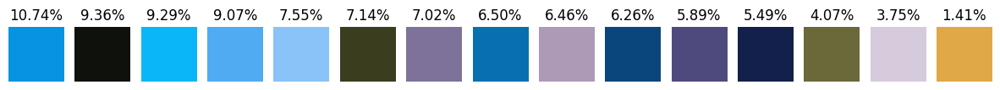

In [19]:
fig, axs = plt.subplots(1, k, figsize=(15, 5))
for i, color in enumerate(dominant_colors):
    block = np.ones((50, 50, 3), dtype='uint8') * np.array(color, dtype='uint8')
    axs[i].imshow(block)
    axs[i].axis('off')
    axs[i].set_title(f'{percentages[i]*100:.2f}%')
plt.show()

In [20]:
compressed_pixels = cluster_centers[labels].astype(np.uint8)

In [21]:
compressed_image = compressed_pixels.reshape(img1.shape)

In [22]:
compressed_image.shape

(410, 728, 3)

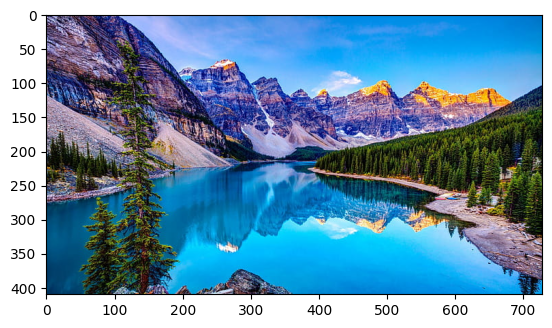

In [23]:
plt.imshow(img1)

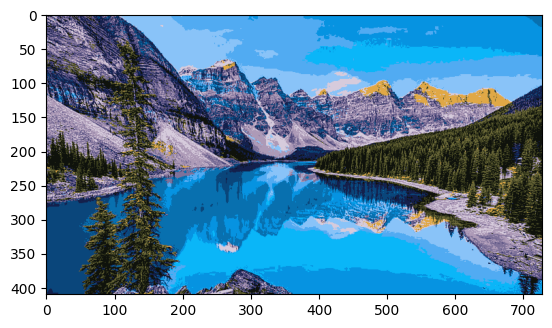

In [24]:
plt.imshow(compressed_image)

In [28]:
from PIL import Image
from google.colab import files
import numpy as np

# Assuming you have a NumPy array representing your compressed image
# Convert the NumPy array to a PIL Image object
compressed_image_pil = Image.fromarray(compressed_image)

# Save the compressed image
compressed_image_pil.save('compressed_image.jpg')  # Adjust file name and format as needed

# Download the saved image to local system
files.download('compressed_image.jpg')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 2. Vegetation Monitoring

In [202]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
img2 = plt.imread('/content/Image1.1.jpeg')
img3 = plt.imread('/content/Image1.2.jpeg')

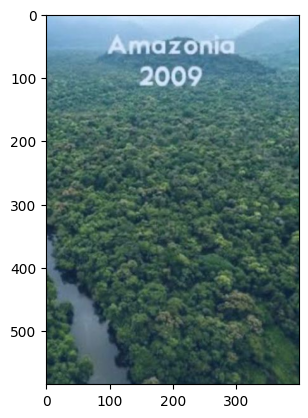

In [203]:
plt.imshow(img2)


In [204]:
img2.shape

(585, 400, 3)

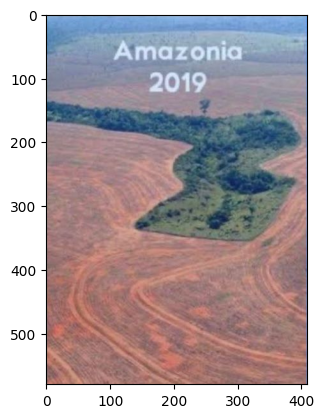

In [205]:
plt.imshow(img3)

In [206]:
img3.shape

(580, 410, 3)

In [207]:
pixels2 = np.reshape(img2, (img2.shape[0]*img2.shape[1],3))

In [208]:
print('Shape of modified image',pixels2.shape)

Shape of modified image (234000, 3)


In [209]:
pixels3 = np.reshape(img3, (img3.shape[0]*img3.shape[1],3))

In [210]:
print('Shape of modified image',pixels3.shape)

Shape of modified image (237800, 3)


In [211]:
clusters = 3

In [212]:
kmeans2 = KMeans(n_clusters=clusters,n_init =10, random_state=0)
kmeans2.fit(pixels2)


KMeans(n_clusters=3, n_init=10, random_state=0)

In [213]:

kmeans3 = KMeans(n_clusters=clusters,n_init = 10 ,random_state=0)
kmeans3.fit(pixels3)

KMeans(n_clusters=3, n_init=10, random_state=0)

In [214]:
cluster_centers2 = kmeans2.cluster_centers_

In [215]:
cluster_centers2

array([[ 85.27982953, 119.47656026, 118.06756803],
       [163.73866132, 199.62951465, 227.72075415],
       [ 47.70933271,  74.86322418,  68.16173164]])

In [216]:
labels2 = kmeans2.labels_

In [217]:
cluster_centers3 = kmeans3.cluster_centers_

In [218]:
cluster_centers3

array([[143.41660046, 159.85289494, 187.05434874],
       [168.02250576, 126.06200048, 122.39886552],
       [ 71.54282187,  96.91776484, 110.1311361 ]])

In [219]:
labels3 = kmeans3.labels_

In [220]:
from collections import Counter
counts2 = Counter(labels2)
counts3 = Counter(labels3)

In [221]:
sorted_counts2 = sorted(counts2.items(), key=lambda x: x[1], reverse=True)
sorted_counts3 = sorted(counts3.items(), key=lambda x: x[1], reverse=True)

In [222]:
dominant_colors2 = [cluster_centers2[labels2] for labels2, count in sorted_counts2]
percentages2 = [count / len(pixels2) for labels2, count in sorted_counts2]

dominant_colors3= [cluster_centers3[labels3] for labels3, count in sorted_counts3]
percentages3 = [count / len(pixels3) for labels3, count in sorted_counts3]

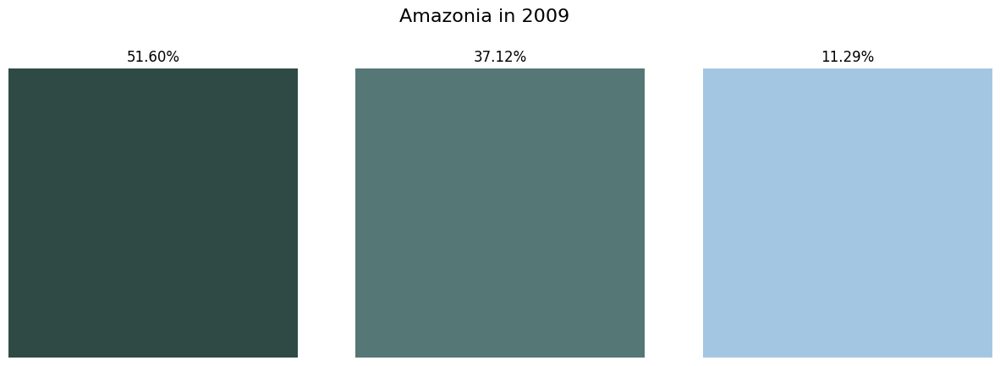

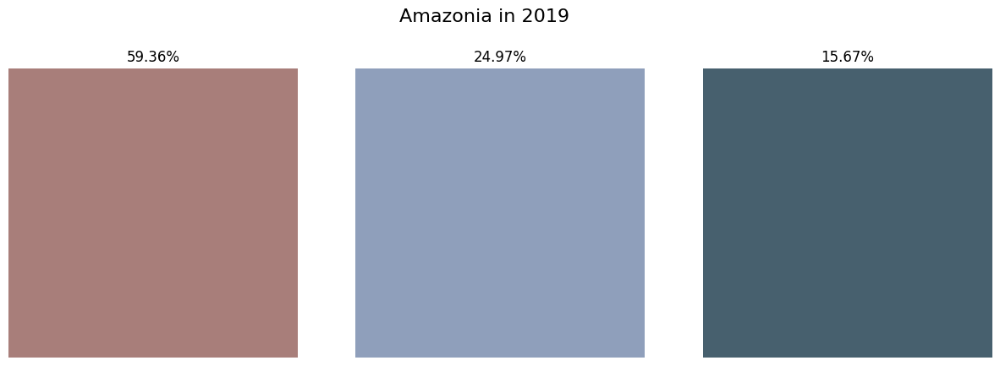

In [223]:
fig, axs = plt.subplots(1, clusters, figsize=(15, 5))
for i, color in enumerate(dominant_colors2):
    block = np.ones((50, 50, 3), dtype='uint8') * np.array(color, dtype='uint8')
    axs[i].imshow(block)
    axs[i].axis('off')
    axs[i].set_title(f'{percentages2[i]*100:.2f}%')
    plt.suptitle('Amazonia in 2009', fontsize=16)
plt.show()



fig, axs = plt.subplots(1, clusters, figsize=(15, 5))
for i, color in enumerate(dominant_colors3):
    block = np.ones((50, 50, 3), dtype='uint8') * np.array(color, dtype='uint8')
    axs[i].imshow(block)
    axs[i].axis('off')
    axs[i].set_title(f'{percentages3[i]*100:.2f}%')
    plt.suptitle('Amazonia in 2019', fontsize=16)
plt.show()



Conclusion: In the year 2009, there was much greenery in the Amazon Forest whi can easily be seen by the percentage of green dominant colours from the first image. However, in the year 2019, much deforestation could be seen as the percentage of greenery is much less and brown colour of soil dominates the image of the same place taken after a decade

In [225]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
img4 = plt.imread('/content/Image2.1.jpeg')
img5 = plt.imread('/content/Image2.2.jpeg')

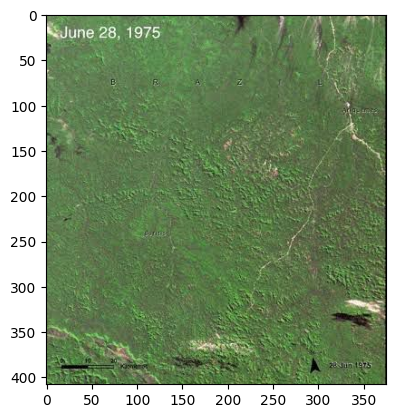

In [226]:
plt.imshow(img4)


In [227]:
img4.shape

(408, 375, 3)

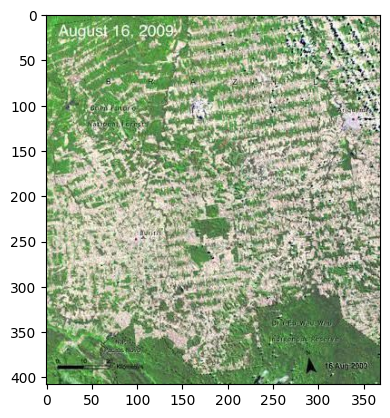

In [228]:
plt.imshow(img5)

In [229]:
img5.shape

(408, 369, 3)

In [230]:
pixels4 = np.reshape(img4, (img4.shape[0]*img4.shape[1],3))

In [231]:
print('Shape of modified image',pixels4.shape)

Shape of modified image (153000, 3)


In [232]:
pixels5 = np.reshape(img5, (img5.shape[0]*img5.shape[1],3))

In [233]:
print('Shape of modified image',pixels5.shape)

Shape of modified image (150552, 3)


In [234]:
clusters = 3

In [235]:
kmeans4 = KMeans(n_clusters=clusters,n_init =10, random_state=0)
kmeans4.fit(pixels4)


KMeans(n_clusters=3, n_init=10, random_state=0)

In [236]:

kmeans5 = KMeans(n_clusters=clusters,n_init = 10 ,random_state=0)
kmeans5.fit(pixels5)

KMeans(n_clusters=3, n_init=10, random_state=0)

In [237]:
cluster_centers4 = kmeans4.cluster_centers_

In [238]:
cluster_centers4

array([[148.49877118, 172.50963653, 127.04501358],
       [ 79.22597979, 105.58245186,  60.99669447],
       [ 99.0163543 , 129.83335072,  82.17594492]])

In [239]:
labels4 = kmeans4.labels_

In [240]:
cluster_centers5 = kmeans5.cluster_centers_

In [241]:
cluster_centers5

array([[152.38969307, 168.62396896, 133.73517043],
       [211.69572081, 214.75120503, 191.15072934],
       [ 90.88334111, 126.16222252,  77.96600227]])

In [242]:
labels5 = kmeans5.labels_

In [243]:
from collections import Counter
counts4 = Counter(labels4)
counts5 = Counter(labels5)

In [244]:
sorted_counts4 = sorted(counts4.items(), key=lambda x: x[1], reverse=True)
sorted_counts5 = sorted(counts5.items(), key=lambda x: x[1], reverse=True)

In [245]:
dominant_colors4 = [cluster_centers4[labels4] for labels4, count in sorted_counts4]
percentages4 = [count / len(pixels4) for labels4, count in sorted_counts4]

dominant_colors5= [cluster_centers5[labels5] for labels5, count in sorted_counts5]
percentages5 = [count / len(pixels5) for labels5, count in sorted_counts5]

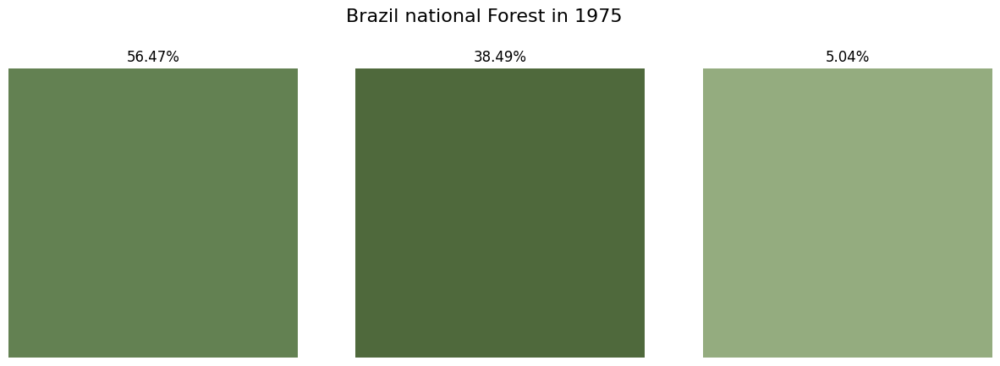

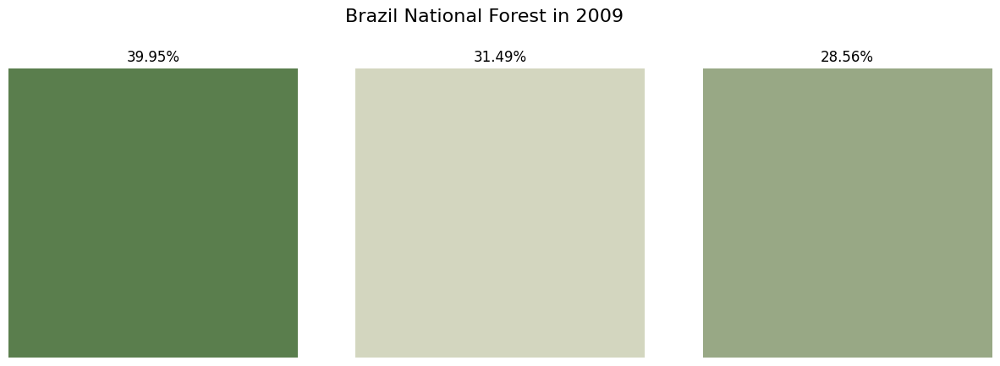

In [246]:
fig, axs = plt.subplots(1, clusters, figsize=(15, 5))
for i, color in enumerate(dominant_colors4):
    block = np.ones((50, 50, 3), dtype='uint8') * np.array(color, dtype='uint8')
    axs[i].imshow(block)
    axs[i].axis('off')
    axs[i].set_title(f'{percentages4[i]*100:.2f}%')
    plt.suptitle('Brazil national Forest in 1975', fontsize=16)
plt.show()



fig, axs = plt.subplots(1, clusters, figsize=(15, 5))
for i, color in enumerate(dominant_colors5):
    block = np.ones((50, 50, 3), dtype='uint8') * np.array(color, dtype='uint8')
    axs[i].imshow(block)
    axs[i].axis('off')
    axs[i].set_title(f'{percentages5[i]*100:.2f}%')
    plt.suptitle('Brazil National Forest in 2009', fontsize=16)
plt.show()



Conclusion: In the year 1975, there was much greenery in the Brazil national Forest which can easily be seen by the percentage of green dominant colours from the first image. However, in the year 2009, much deforestation could be seen as the percentage of greenery is lesser than before and the colour of the soil is present in much percentage.

## 3. Revealing Hidden patterns in Geospatial Data

In [140]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
import folium
%matplotlib inline

In [141]:
data = pd.read_csv('/content/Map_data.csv')

In [142]:
data.head()

,Earthquake Date Time,Id,Place,Latitude,Longitude,Magnitude,Magnitude^10
0,6/16/2013,usc000hsdj,"81km S of Pirgos, Greece",34.270,25.114,6.0,60466176.0
1,6/15/2013,usc000hrgh,south of the Kermadec Islands,-33.853,179.402,6.0,60466176.0
2,5/7/2013,usc000gpwn,"239km NNE of Ceva-i-Ra, Fiji",-19.638,175.064,6.0,60466176.0
3,2/10/2013,usc000f4zf,"48km WSW of Lata, Solomon Islands",-10.959,165.459,6.0,60466176.0
4,2/7/2013,usc000f2ul,"142km SW of Lata, Solomon Islands",-11.658,164.940,6.0,60466176.0


In [143]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4275 entries, 0 to 4274
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Earthquake Date Time  4275 non-null   object 
 1   Id                    4275 non-null   object 
 2   Place                 4275 non-null   object 
 3   Latitude              4275 non-null   float64
 4   Longitude             4275 non-null   float64
 5   Magnitude             4275 non-null   float64
 6   Magnitude^10          4275 non-null   float64
dtypes: float64(4), object(3)
memory usage: 233.9+ KB


In [144]:
data.describe()

,Latitude,Longitude,Magnitude,Magnitude^10
count,4275.000000,4275.000000,4275.000000,4.275000e+03
mean,2.706652,47.230383,6.404234,1.502406e+08
std,29.308763,122.440331,0.429159,1.825603e+08
min,-63.659000,-179.990000,6.000000,6.046618e+07
25%,-17.435000,-72.236000,6.100000,7.133429e+07
50%,-2.384000,118.715000,6.300000,9.849303e+07
75%,28.207500,146.662000,6.600000,1.568337e+08
max,64.005000,179.998000,9.100000,3.894161e+09


In [145]:
X1 = data[['Latitude','Longitude']].values.tolist()
X1

[[34.27, 25.114],
 [-33.853, 179.402],
 [-19.638, 175.064],
 [-10.959, 165.459],
 [-11.658, 164.94],
 [-11.245, 165.727],
 [-10.643, 164.764],
 [-10.865, 165.248],
 [-10.938, 165.255],
 [-11.104, 165.532],
 [44.4438, 149.1667],
 [2.044, 96.8261],
 [-53.8708, -53.9107],
 [45.5613, 151.0047],
 [18.4753, 145.2041],
 [2.6403, 128.4339],
 [-23.6357, -112.5956],
 [-23.0067, -177.1425],
 [10.9048, -62.315],
 [12.3115, 141.6905],
 [15.1836, -45.232],
 [51.573, -174.8537],
 [51.1832, -130.2245],
 [51.2381, -174.9407],
 [-7.1354, 129.8088],
 [-15.2443, -173.5006],
 [-15.6346, -71.7729],
 [-6.3085, 154.7822],
 [-3.249, 100.5668],
 [52.469, 160.486],
 [37.739, 141.471],
 [18.127, -101.908],
 [-19.141, 169.535],
 [39.516, 143.2076],
 [52.291, 174.011],
 [0.533, 126.231],
 [-5.705, 151.602],
 [-8.866, -75.071],
 [4.232, 124.52],
 [-12.476, 166.513],
 [49.407, 155.907],
 [45.497, 151.288],
 [57.601, 163.195],
 [53.351, 171.619],
 [36.42, 28.88],
 [-36.074, -70.57],
 [26.91, 140.055],
 [-50.42, 139.51

In [146]:
map = folium.Map()
map


In [147]:
for i in X1:
  folium.CircleMarker(i, color ='blue').add_to(map)

In [148]:
map

In [181]:
X = data[['Latitude','Longitude']]

In [182]:
wcss = []
for i in range(5,20):
  model = KMeans(n_clusters = i,n_init = 10, random_state = 0)
  y_kmeans = model.fit_predict(X)
  wcss.append(model.inertia_)

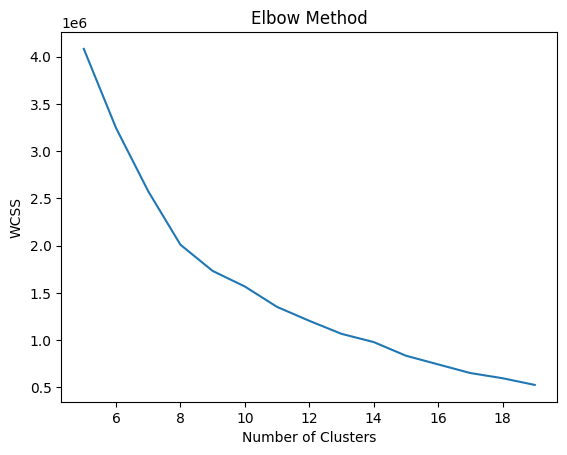

In [183]:
plt.plot(range(5,20),wcss)
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.title('Elbow Method')
plt.show()

In [184]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

k_values = range(5,20)


silhouette_scores = []

for k in k_values:

    kmeans = KMeans(n_clusters=k,n_init=10,random_state=0)
    labels = kmeans.fit_predict(X)

    silhouette_avg = silhouette_score(X, labels)
    silhouette_scores.append(silhouette_avg)

best_k = k_values[np.argmax(silhouette_scores)]
best_score = silhouette_scores[np.argmax(silhouette_scores)]

print(silhouette_scores)

print("Best k value:", best_k)
print("Silhouette score for best k value:", best_score)


[0.4938560031747427, 0.5093050343300587, 0.5455840495682351, 0.5533982577992824, 0.5504095725852954, 0.5074695297149624, 0.5394098599685313, 0.5500700647592665, 0.561462224317414, 0.5609903069767628, 0.574280640254064, 0.5794513157554276, 0.5862318537596658, 0.5686872968707598, 0.5841843763197732]
Best k value: 17
Silhouette score for best k value: 0.5862318537596658


In [185]:
k = int(input('Enter number of clusters:'))

Enter number of clusters:15


In [186]:
model = KMeans(n_clusters = k, n_init = 10, random_state = 0)

In [188]:
y_kmeans = model.fit_predict(X)

In [189]:
y_kmeans


array([ 2, 12,  1, ...,  5,  4,  6], dtype=int32)

In [190]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X, y_kmeans)
print("The average silhouette_score is :", silhouette_avg)

The average silhouette_score is : 0.574280640254064


In [191]:
X['y'] = y_kmeans

<ipython-input-191-4bd621eb25df>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['y'] = y_kmeans


In [192]:
X.head()

,Latitude,Longitude,y
0,34.270,25.114,2
1,-33.853,179.402,12
2,-19.638,175.064,1
3,-10.959,165.459,1
4,-11.658,164.940,1


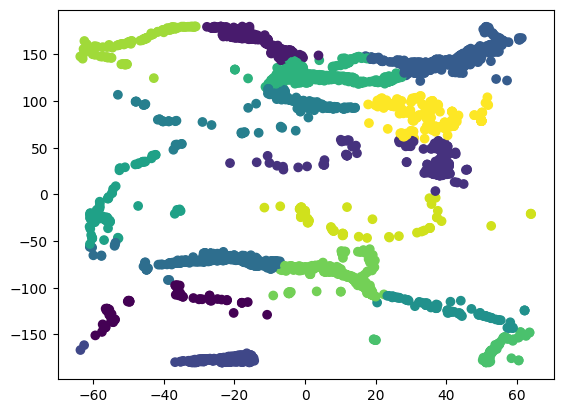

In [193]:
plt.scatter(X['Latitude'],X['Longitude'], c = X['y'])

In [195]:
cluster1 = X[['Latitude','Longitude']][X['y']==0].values.tolist()
cluster2 = X[['Latitude','Longitude']][X['y']==1].values.tolist()
cluster3 = X[['Latitude','Longitude']][X['y']==2].values.tolist()
cluster4 = X[['Latitude','Longitude']][X['y']==3].values.tolist()
cluster5 = X[['Latitude','Longitude']][X['y']==4].values.tolist()
cluster6 = X[['Latitude','Longitude']][X['y']==5].values.tolist()
cluster7 = X[['Latitude','Longitude']][X['y']==6].values.tolist()
cluster8 = X[['Latitude','Longitude']][X['y']==7].values.tolist()
cluster9 = X[['Latitude','Longitude']][X['y']==8].values.tolist()
cluster10 = X[['Latitude','Longitude']][X['y']==9].values.tolist()
cluster11 = X[['Latitude','Longitude']][X['y']==10].values.tolist()
cluster12 = X[['Latitude','Longitude']][X['y']==11].values.tolist()
cluster13 = X[['Latitude','Longitude']][X['y']==12].values.tolist()
cluster14 = X[['Latitude','Longitude']][X['y']==13].values.tolist()
cluster15 = X[['Latitude','Longitude']][X['y']==14].values.tolist()
cluster16 = X[['Latitude','Longitude']][X['y']==15].values.tolist()
cluster17 = X[['Latitude','Longitude']][X['y']==16].values.tolist()
cluster18 = X[['Latitude','Longitude']][X['y']==17].values.tolist()
cluster19 = X[['Latitude','Longitude']][X['y']==18].values.tolist()
cluster20 = X[['Latitude','Longitude']][X['y']==19].values.tolist()



In [196]:
map2 = folium.Map()
map2

In [197]:
for i in cluster1:
  folium.CircleMarker(i, color ='blue').add_to(map2)

for i in cluster2:
  folium.CircleMarker(i, color ='red').add_to(map2)

for i in cluster3:
  folium.CircleMarker(i, color ='green').add_to(map2)

for i in cluster4:
  folium.CircleMarker(i, color ='orange').add_to(map2)

for i in cluster5:
  folium.CircleMarker(i, color ='yellow').add_to(map2)

for i in cluster6:
  folium.CircleMarker(i, color ='pink').add_to(map2)

for i in cluster7:
  folium.CircleMarker(i, color ='purple').add_to(map2)

for i in cluster8:
  folium.CircleMarker(i, color ='gold').add_to(map2)

for i in cluster9:
  folium.CircleMarker(i, color ='navy').add_to(map2)

for i in cluster10:
  folium.CircleMarker(i, color ='olive').add_to(map2)

for i in cluster11:
  folium.CircleMarker(i, color ='teal').add_to(map2)

for i in cluster12:
  folium.CircleMarker(i, color ='lime').add_to(map2)

for i in cluster13:
  folium.CircleMarker(i, color ='magenta').add_to(map2)

for i in cluster14:
  folium.CircleMarker(i, color ='cyan').add_to(map2)

for i in cluster15:
  folium.CircleMarker(i, color ='gray').add_to(map2)

for i in cluster16:
  folium.CircleMarker(i, color ='black').add_to(map2)

for i in cluster17:
  folium.CircleMarker(i, color ='brown').add_to(map2)

for i in cluster18:
  folium.CircleMarker(i, color ='silver').add_to(map2)

for i in cluster19:
  folium.CircleMarker(i, color ='maroon').add_to(map2)

for i in cluster20:
  folium.CircleMarker(i, color ='white').add_to(map2)





In [269]:
map2